# Fast gradient sign method

FGSM is a simple technique for generating adversarial examples by perturbing the input image in the direction of the gradient of the loss function with respect to the input. The goal is to mislead the model into making an incorrect prediction.

In [1]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import requests
import matplotlib.pyplot as plt
import numpy as np


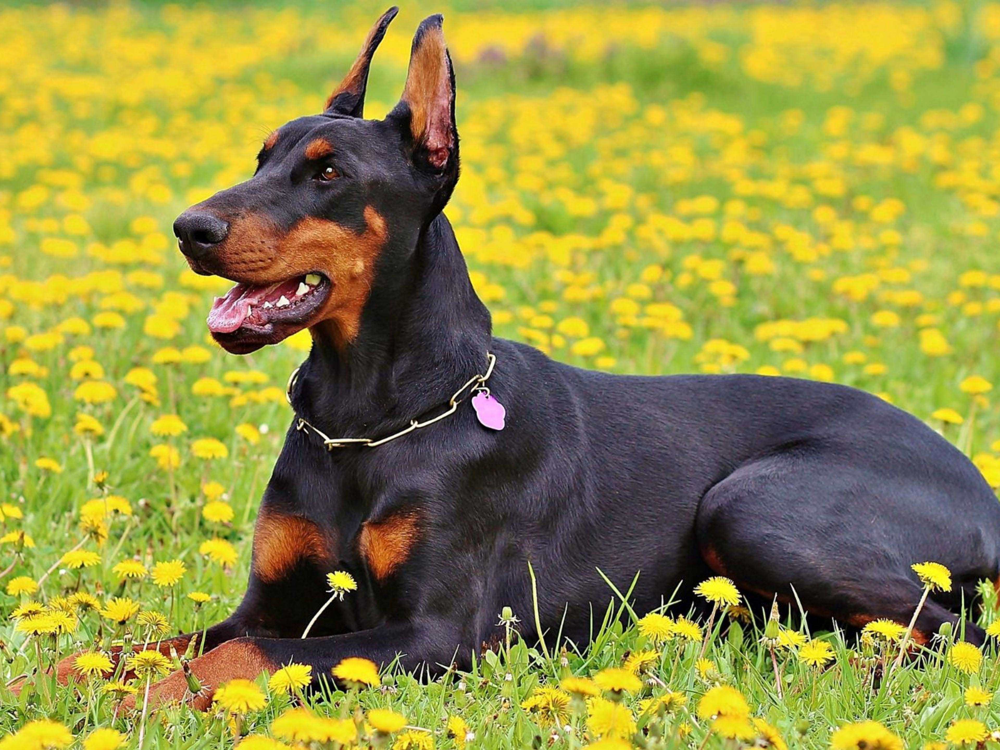

In [2]:
url = "https://pethelpful.com/.image/w_3840,q_auto:good,c_fill,ar_4:3/MjAwMzg3MjgzOTk0NjE3MjA4/doberman-pinscher-guide.jpg"
image = Image.open(requests.get(url, stream=True).raw).convert("RGB")

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

input_tensor = transform(image).unsqueeze(0)
display(image)


In [3]:
!wget -q https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt

In [4]:
model = models.resnet18(pretrained=True).eval()

with open("imagenet_classes.txt") as f:
    labels = [line.strip() for line in f.readlines()]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
with torch.no_grad():
    output = model(input_tensor)
    orig_idx = output.argmax(dim=1).item()
    print(f"Original Prediction: {labels[orig_idx]}")


Original Prediction: Doberman


### FGSM attack

In [6]:
def fgsm_attack(model, image, label_idx, epsilon):
    image.requires_grad = True
    output = model(image)
    loss = nn.CrossEntropyLoss()(output, torch.tensor([label_idx]))

    model.zero_grad()
    loss.backward()
    perturbed = image + epsilon * image.grad.data.sign()
    perturbed = torch.clamp(perturbed, 0, 1)
    return perturbed


In [7]:
epsilon = 0.2
adv_image = fgsm_attack(model, input_tensor.clone(), orig_idx, epsilon)

with torch.no_grad():
    adv_output = model(adv_image)
    adv_idx = adv_output.argmax(dim=1).item()

print(f"Adversarial Prediction: {labels[adv_idx]}")


Adversarial Prediction: Gordon setter


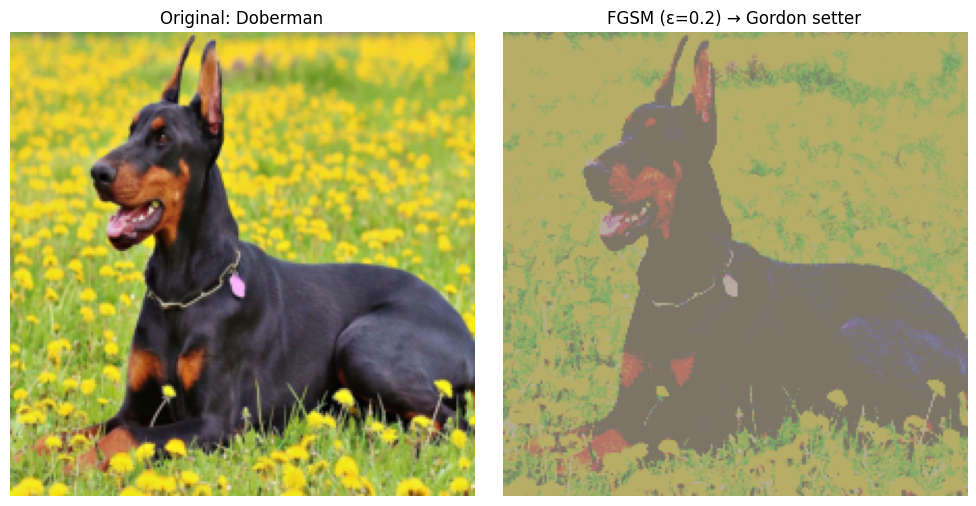

In [8]:
# Undo normalization for visualization
def denormalize(t):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return torch.clamp(t * std + mean, 0, 1)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(denormalize(input_tensor.squeeze()).permute(1, 2, 0).numpy())
axs[0].set_title(f"Original: {labels[orig_idx]}")
axs[0].axis('off')

axs[1].imshow(denormalize(adv_image.squeeze()).permute(1, 2, 0).detach().numpy())
axs[1].set_title(f"FGSM (ε={epsilon}) → {labels[adv_idx]}")
axs[1].axis('off')
plt.tight_layout()
plt.show()


In [9]:
epsilon = 0.6
adv_image = fgsm_attack(model, input_tensor.clone(), orig_idx, epsilon)

with torch.no_grad():
    adv_output = model(adv_image)
    adv_idx = adv_output.argmax(dim=1).item()

print(f"Adversarial Prediction: {labels[adv_idx]}")


Adversarial Prediction: jigsaw puzzle


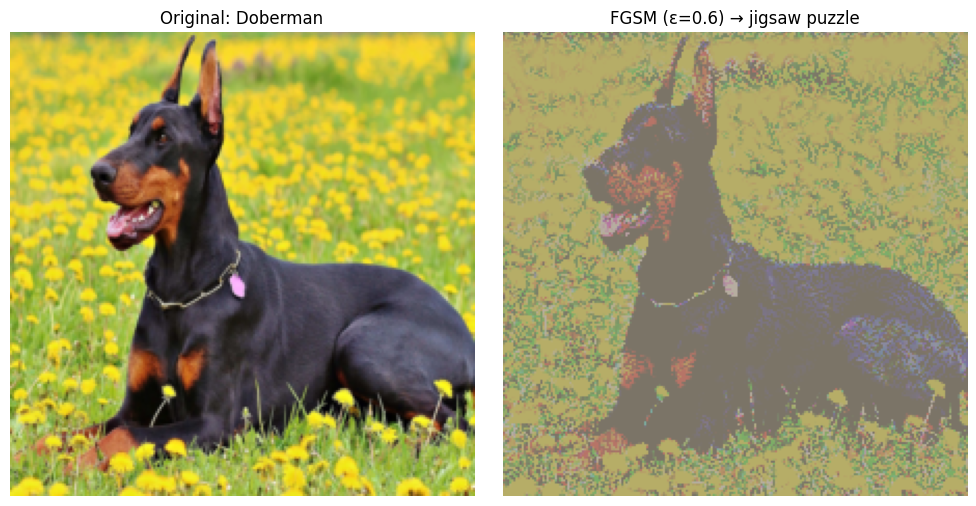

In [10]:
def denormalize(t):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return torch.clamp(t * std + mean, 0, 1)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(denormalize(input_tensor.squeeze()).permute(1, 2, 0).numpy())
axs[0].set_title(f"Original: {labels[orig_idx]}")
axs[0].axis('off')

axs[1].imshow(denormalize(adv_image.squeeze()).permute(1, 2, 0).detach().numpy())
axs[1].set_title(f"FGSM (ε={epsilon}) → {labels[adv_idx]}")
axs[1].axis('off')
plt.tight_layout()
plt.show()
